In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from src.config import DADOS_ORIGINAIS, DADOS_LIMPOS
from src.graficos import SCATTER_ALPHA
from src.graficos import PALETTE

pd.set_option ('display.max_columns', None)

pd.set_option('display.float_format', lambda x: '%.2f' % x)

sns.set_theme(palette='ocean')

In [2]:
df = pd.read_csv(DADOS_ORIGINAIS, compression='zip')
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.00,880.00,129.00,322.00,126.00,8.33,452600.00,NEAR BAY
1,-122.22,37.86,21.00,7099.00,1106.00,2401.00,1138.00,8.30,358500.00,NEAR BAY
2,-122.24,37.85,52.00,1467.00,190.00,496.00,177.00,7.26,352100.00,NEAR BAY
3,-122.25,37.85,52.00,1274.00,235.00,558.00,219.00,5.64,341300.00,NEAR BAY
4,-122.25,37.85,52.00,1627.00,280.00,565.00,259.00,3.85,342200.00,NEAR BAY


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [4]:
df.describe(exclude= "number")

,ocean_proximity
count,20640
unique,5
top,<1H OCEAN
freq,9136


In [5]:
df["ocean_proximity"].value_counts() 

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

Apenas 5 casos de Island é um valor muito baixo e portanto pouco provável que o modelo consiga aprender sobre essa categoria.


Only 5 cases of Island is a very low number and therefore unlikely that the model will be able to learn about this category.

In [6]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.00,20640.00,20640.00,20640.00,20433.00,20640.00,20640.00,20640.00,20640.00
mean,-119.57,35.63,28.64,2635.76,537.87,1425.48,499.54,3.87,206855.82
std,2.00,2.14,12.59,2181.62,421.39,1132.46,382.33,1.90,115395.62
min,-124.35,32.54,1.00,2.00,1.00,3.00,1.00,0.50,14999.00
25%,-121.80,33.93,18.00,1447.75,296.00,787.00,280.00,2.56,119600.00
50%,-118.49,34.26,29.00,2127.00,435.00,1166.00,409.00,3.53,179700.00
75%,-118.01,37.71,37.00,3148.00,647.00,1725.00,605.00,4.74,264725.00
max,-114.31,41.95,52.00,39320.00,6445.00,35682.00,6082.00,15.00,500001.00


In [7]:
df[df.duplicated()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


In [8]:
df[df.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
290,-122.16,37.77,47.00,1256.00,NaN,570.00,218.00,4.38,161900.00,NEAR BAY
341,-122.17,37.75,38.00,992.00,NaN,732.00,259.00,1.62,85100.00,NEAR BAY
538,-122.28,37.78,29.00,5154.00,NaN,3741.00,1273.00,2.58,173400.00,NEAR BAY
563,-122.24,37.75,45.00,891.00,NaN,384.00,146.00,4.95,247100.00,NEAR BAY
696,-122.10,37.69,41.00,746.00,NaN,387.00,161.00,3.91,178400.00,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.00,3620.00,NaN,3171.00,779.00,3.34,220500.00,NEAR OCEAN
20268,-119.18,34.19,19.00,2393.00,NaN,1938.00,762.00,1.70,167400.00,NEAR OCEAN
20372,-118.88,34.17,15.00,4260.00,NaN,1701.00,669.00,5.10,410700.00,<1H OCEAN
20460,-118.75,34.29,17.00,5512.00,NaN,2734.00,814.00,6.61,258100.00,<1H OCEAN


In [9]:
df[df.isnull().any(axis=1)].describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,207.00,207.00,207.00,207.00,0.00,207.00,207.00,207.00,207.00
mean,-119.47,35.50,29.27,2562.60,NaN,1477.77,510.02,3.82,206007.28
std,2.00,2.10,11.96,1787.27,NaN,1057.45,386.12,1.96,111638.21
min,-124.13,32.66,4.00,154.00,NaN,37.00,16.00,0.85,45800.00
25%,-121.81,33.97,19.00,1307.50,NaN,781.00,258.00,2.56,128750.00
50%,-118.49,34.20,30.00,2155.00,NaN,1217.00,427.00,3.41,175000.00
75%,-117.98,37.49,38.00,3465.00,NaN,1889.50,628.00,4.62,267700.00
max,-114.59,40.92,52.00,11709.00,NaN,7604.00,3589.00,15.00,500001.00


Não foi possível reconhcer um padrão, ou motivo para esse valores ausentes.

It was not possible to recognize a pattern, or reason for these missing values.

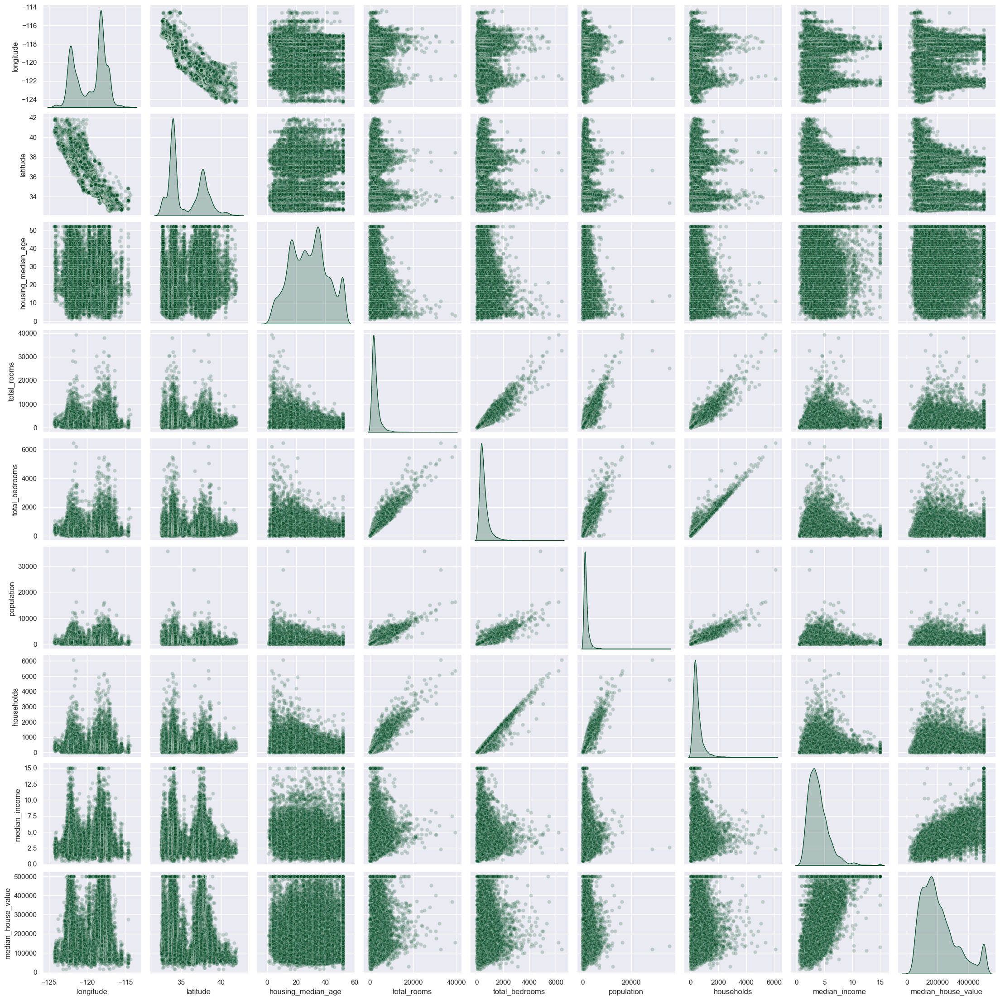

In [10]:
sns.pairplot(df, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA))


Valores com acúmulo no topo (como  'housing_media-age', 'media_income'), são indicativos de que os dados podem ter sido limitados a determinado valor.
Esse acúmulo de valores (artificial), pode criar um problema para o treinamento do modelo.

Values with accumulation at the top (such as 'housing_media-age', 'media_income'), are indicative that the data may have been limited to a certain value.
This (artificial) accumulation of values can create a problem for training the model.

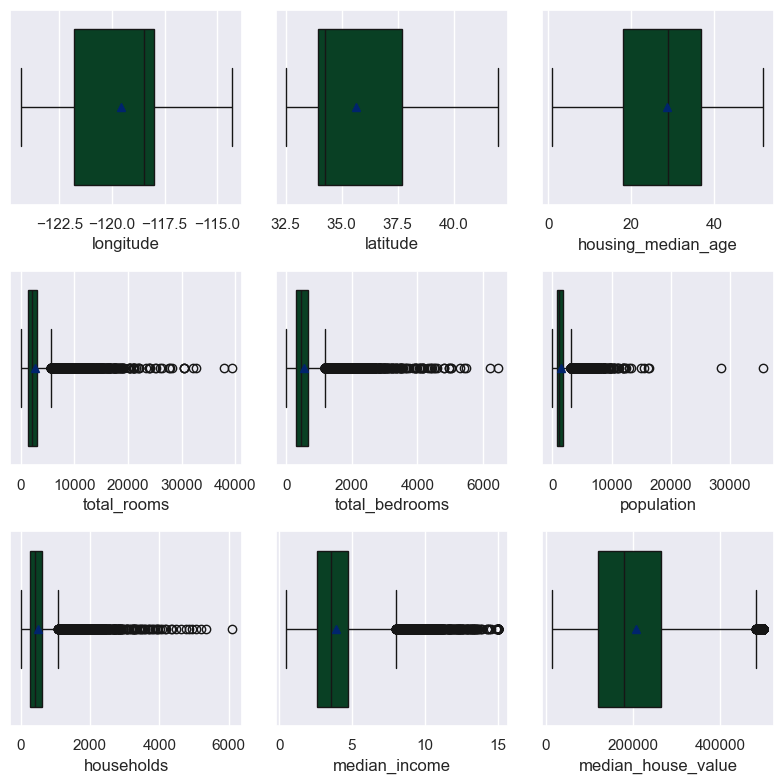

In [11]:
fig, axs = plt.subplots(3,3, figsize =(8,8))

for ax, coluna in zip(axs.flatten(), df.columns):
    sns.boxplot(
        x=df[coluna],
        ax=ax,
        showmeans=True
    )
plt.tight_layout()
plt.show()

In [12]:
df.select_dtypes("number").skew()

longitude            -0.30
latitude              0.47
housing_median_age    0.06
total_rooms           4.15
total_bedrooms        3.46
population            4.94
households            3.41
median_income         1.65
median_house_value    0.98
dtype: float64

In [13]:
df.select_dtypes("number").kurtosis()

longitude            -1.33
latitude             -1.12
housing_median_age   -0.80
total_rooms          32.63
total_bedrooms       21.99
population           73.55
households           22.06
median_income         4.95
median_house_value    0.33
dtype: float64

In [14]:
df.select_dtypes("number").corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.00,-0.92,-0.11,0.04,0.07,0.10,0.06,-0.02,-0.05
latitude,-0.92,1.00,0.01,-0.04,-0.07,-0.11,-0.07,-0.08,-0.14
housing_median_age,-0.11,0.01,1.00,-0.36,-0.32,-0.30,-0.30,-0.12,0.11
total_rooms,0.04,-0.04,-0.36,1.00,0.93,0.86,0.92,0.20,0.13
total_bedrooms,0.07,-0.07,-0.32,0.93,1.00,0.88,0.98,-0.01,0.05
population,0.10,-0.11,-0.30,0.86,0.88,1.00,0.91,0.00,-0.02
households,0.06,-0.07,-0.30,0.92,0.98,0.91,1.00,0.01,0.07
median_income,-0.02,-0.08,-0.12,0.20,-0.01,0.00,0.01,1.00,0.69
median_house_value,-0.05,-0.14,0.11,0.13,0.05,-0.02,0.07,0.69,1.00


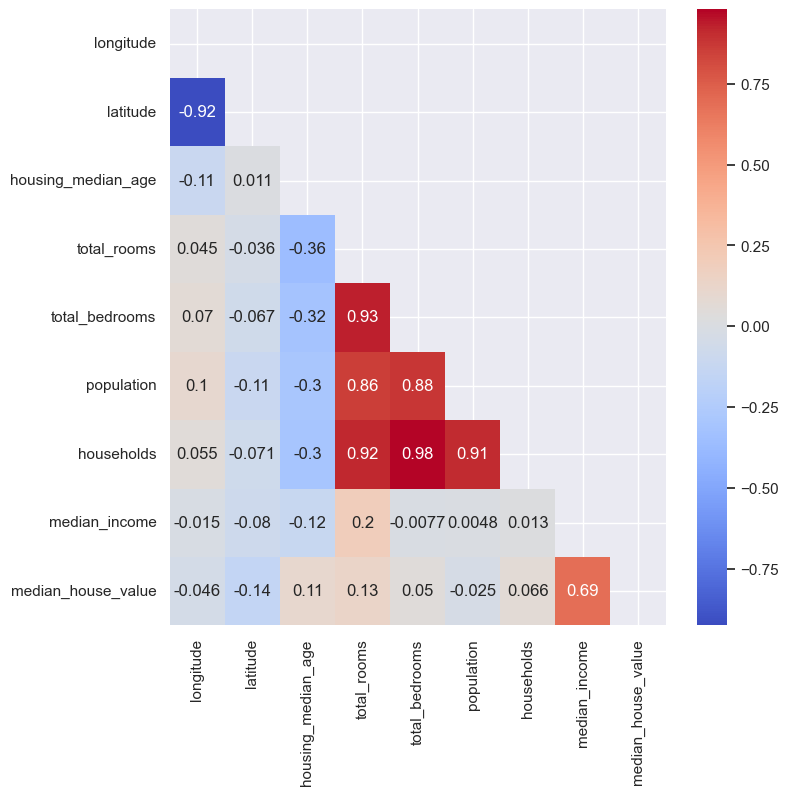

In [15]:
matriz=np.triu(df.select_dtypes("number").corr()) #para exibir apenas metade do heatmap, já que é duplicado
fig, ax = plt.subplots(figsize=(8,8))

sns.heatmap(df.select_dtypes("number").corr(), 
            mask=matriz, 
            annot=True, 
            ax=ax, 
            cmap=PALETTE) 

plt.show()

Multicolinearidade (total bedrooms, population e housholds).
A única variável que tem correlação forte com o nosso target é a média de income
Nesse tipo de situação, às vezes é interessante tentar criar novas features. 
Primeiro a partir das colunas que já existem (razão entre colunas existentes ou estratificando dados)


Além disso, tratar outliers e demais dados também pode afetar o modelo
Algumas possibilidades de novas variáveis:
-criar classes em 'media_income'
-quartos por domicílio e pessoas por domcílio pode fazer sentido-> cômodos por domicílio
-quartos por comodos

Através da análise do describe os bins serão definidos.

Multicollinearity (total bedrooms, population and housholds).
The only variable that has a strong correlation with our target is the average income
In this type of situation, it is sometimes interesting to try to create new features.
First from the columns that already exist (ratio between existing columns or stratifying data)

In addition, treating outliers and other data can also affect the model
Some possibilities for new variables:
-create classes in 'median_income'
-bedrooms per household and people per household may make sense-> rooms per household
-bedrooms per rooms

Through the describe analysis, the bins will be defined.


In [16]:
df['median_income_cat'] = pd.cut(
    df['median_income'],
    bins=[0, 1.5, 3, 4.5, 6, np.inf],
    labels=[1,2,3,4,5],
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20640 non-null  float64 
 1   latitude            20640 non-null  float64 
 2   housing_median_age  20640 non-null  float64 
 3   total_rooms         20640 non-null  float64 
 4   total_bedrooms      20433 non-null  float64 
 5   population          20640 non-null  float64 
 6   households          20640 non-null  float64 
 7   median_income       20640 non-null  float64 
 8   median_house_value  20640 non-null  float64 
 9   ocean_proximity     20640 non-null  object  
 10  median_income_cat   20640 non-null  category
dtypes: category(1), float64(9), object(1)
memory usage: 1.6+ MB


In [17]:
df['median_income_cat'].value_counts().sort_index()

median_income_cat
1     822
2    6581
3    7236
4    3639
5    2362
Name: count, dtype: int64

<Axes: xlabel='median_income_cat'>

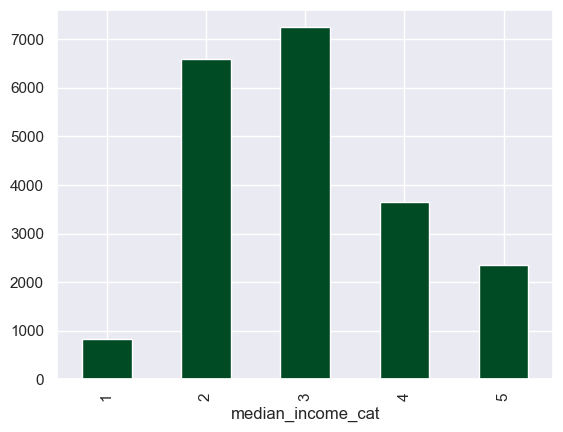

In [18]:
df['median_income_cat'].value_counts().sort_index().plot(kind='bar')

In [19]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', 'median_income_cat'],
      dtype='object')

In [20]:
df['rooms_per_household']=df['total_rooms'] / df['households']
df['population_per_household']=df['population'] / df['households']
df['bedrooms_per_room']= df['total_bedrooms'] /df['total_rooms']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  object  
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedrooms_per_room         20433 non-null  floa

In [21]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedrooms_per_room
count,20640.00,20640.00,20640.00,20640.00,20433.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20433.00
mean,-119.57,35.63,28.64,2635.76,537.87,1425.48,499.54,3.87,206855.82,5.43,3.07,0.21
std,2.00,2.14,12.59,2181.62,421.39,1132.46,382.33,1.90,115395.62,2.47,10.39,0.06
min,-124.35,32.54,1.00,2.00,1.00,3.00,1.00,0.50,14999.00,0.85,0.69,0.10
25%,-121.80,33.93,18.00,1447.75,296.00,787.00,280.00,2.56,119600.00,4.44,2.43,0.18
50%,-118.49,34.26,29.00,2127.00,435.00,1166.00,409.00,3.53,179700.00,5.23,2.82,0.20
75%,-118.01,37.71,37.00,3148.00,647.00,1725.00,605.00,4.74,264725.00,6.05,3.28,0.24
max,-114.31,41.95,52.00,39320.00,6445.00,35682.00,6082.00,15.00,500001.00,141.91,1243.33,1.00


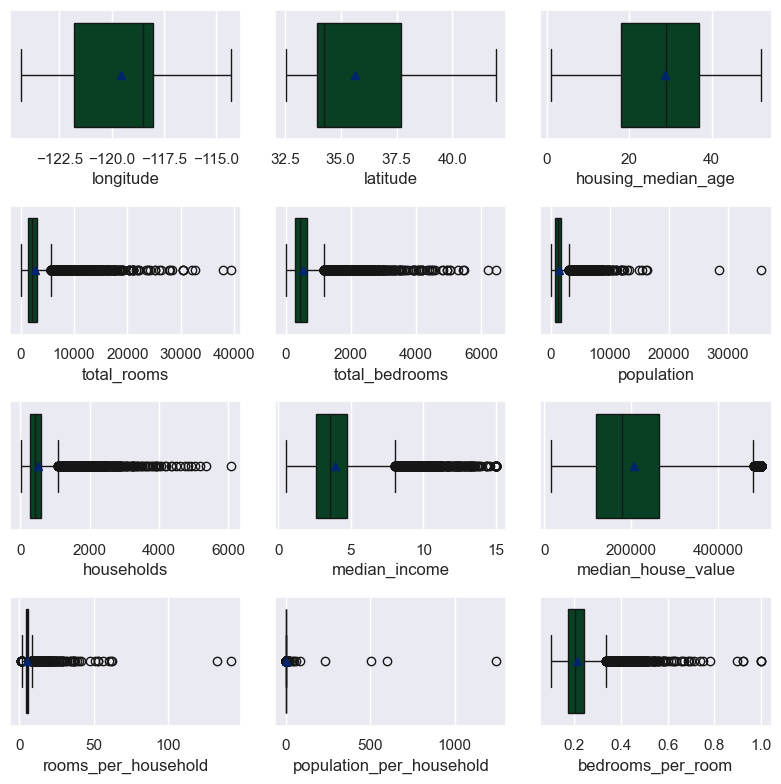

In [22]:
fig, axs = plt.subplots(4,3, figsize =(8,8))

for ax, coluna in zip(axs.flatten(), df.select_dtypes('number').columns):
    sns.boxplot(
        x=df[coluna],
        ax=ax,
        showmeans=True
    )
plt.tight_layout()
plt.show()

A razão esperada entre quartos por cômodo seria menor que 1, o outlier pode estar relacionado a a definição de domicílio (por exemplo hotel)
Não foi feita uma investigação a respeito.


The expected ratio of rooms per room would be less than 1, the outlier may be related to the definition of domicile (e.g. hotel)
No investigation was carried out on this subject.


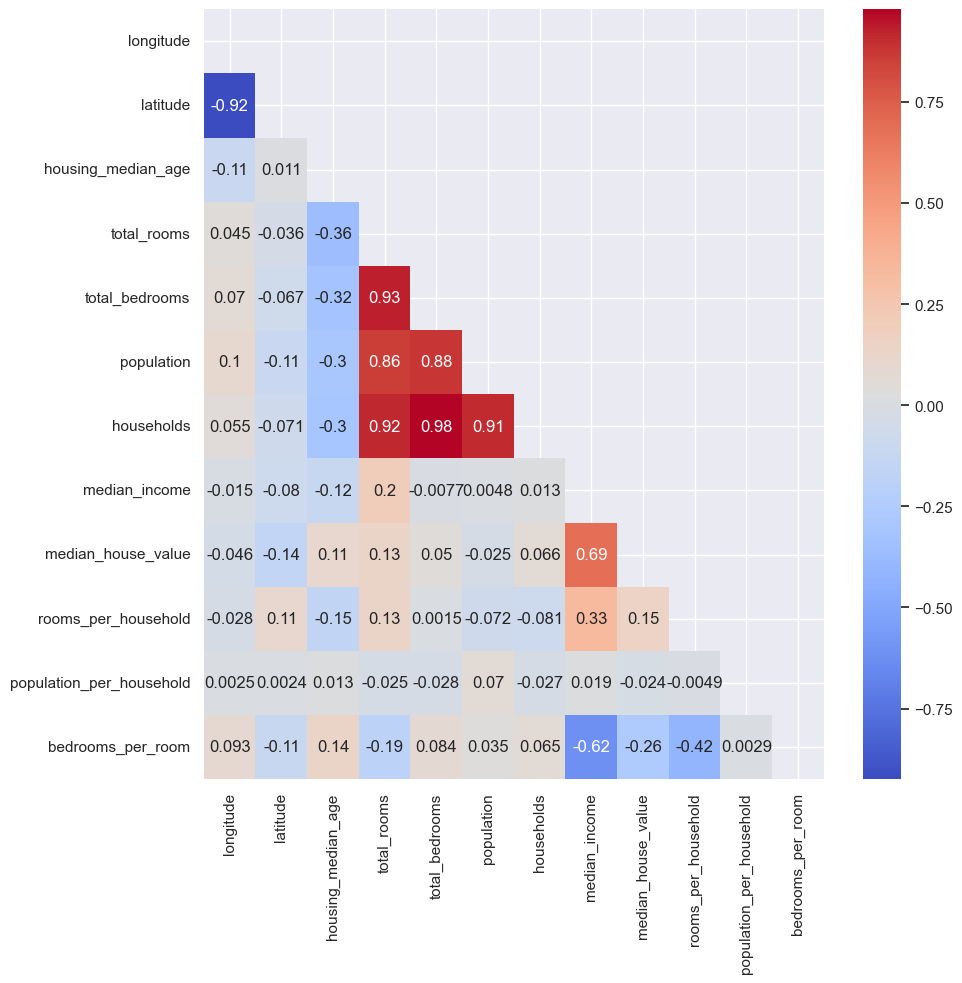

In [23]:
matriz=np.triu(df.select_dtypes("number").corr()) 
fig, ax = plt.subplots(figsize=(10,10))

sns.heatmap(df.select_dtypes("number").corr(), 
            mask=matriz, 
            annot=True, 
            ax=ax, 
            cmap=PALETTE) 

plt.show()

Tratamento outliers e valores nulos: checar quantos valores são iguais ao valor máximo
Avaliar a retirada dessas linhas.

Treatment of outliers and null values: check how many values are equal to the maximum value.
Evaluate the removal of these rows.

In [24]:
df[
    df['median_house_value'] == df['median_house_value'].max() 
]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room
89,-122.27,37.80,52.00,249.00,78.00,396.00,85.00,1.24,500001.00,NEAR BAY,1,2.93,4.66,0.31
459,-122.25,37.87,52.00,609.00,236.00,1349.00,250.00,1.17,500001.00,NEAR BAY,1,2.44,5.40,0.39
493,-122.24,37.86,52.00,1668.00,225.00,517.00,214.00,7.85,500001.00,NEAR BAY,5,7.79,2.42,0.13
494,-122.24,37.85,52.00,3726.00,474.00,1366.00,496.00,9.40,500001.00,NEAR BAY,5,7.51,2.75,0.13
509,-122.23,37.83,52.00,2990.00,379.00,947.00,361.00,7.88,500001.00,NEAR BAY,5,8.28,2.62,0.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20422,-118.90,34.14,35.00,1503.00,263.00,576.00,216.00,5.15,500001.00,<1H OCEAN,4,6.96,2.67,0.17
20426,-118.69,34.18,11.00,1177.00,138.00,415.00,119.00,10.05,500001.00,<1H OCEAN,5,9.89,3.49,0.12
20427,-118.80,34.19,4.00,15572.00,2222.00,5495.00,2152.00,8.65,500001.00,<1H OCEAN,5,7.24,2.55,0.14
20436,-118.69,34.21,10.00,3663.00,409.00,1179.00,371.00,12.54,500001.00,<1H OCEAN,5,9.87,3.18,0.11


In [25]:
965/df.shape[0]

0.04675387596899225

In [26]:
df[
    df['median_house_value'] == df['median_house_value'].min() 
]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room
2521,-122.74,39.71,16.00,255.00,73.00,85.00,38.00,1.66,14999.00,INLAND,2,6.71,2.24,0.29
2799,-117.02,36.40,19.00,619.00,239.00,490.00,164.00,2.10,14999.00,INLAND,2,3.77,2.99,0.39
9188,-117.86,34.24,52.00,803.00,267.00,628.00,225.00,4.19,14999.00,INLAND,3,3.57,2.79,0.33
19802,-123.17,40.31,36.00,98.00,28.00,18.00,8.00,0.54,14999.00,INLAND,1,12.25,2.25,0.29


In [27]:
df['median_house_value'].quantile(0.98)

500001.0

In [28]:
df['median_house_value'].quantile(0.96)

500001.0

In [29]:
df['median_house_value'].quantile(0.95)

489809.9999999999

In [30]:
df_clean = df.copy()
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  object  
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedrooms_per_room         20433 non-null  floa

In [31]:

QUANTIL = 0.99
df_clean = df_clean[
    (df['housing_median_age']<df['housing_median_age'].quantile(QUANTIL))
    &  (df['total_rooms']<df['total_rooms'].quantile(QUANTIL))
    &  (df['total_bedrooms']<df['total_bedrooms'].quantile(QUANTIL))
    &  (df['population']<df['population'].quantile(QUANTIL))
    &  (df['households']<df['households'].quantile(QUANTIL))
    &  (df['median_income']<df['median_income'].quantile(QUANTIL))
    &  (df['median_house_value']<df['median_house_value'].quantile(QUANTIL))
    &  (df['rooms_per_household']<df['rooms_per_household'].quantile(QUANTIL))
    &  (df['population_per_household']<df['population_per_household'].quantile(QUANTIL))
    &  (df['bedrooms_per_room']<df['bedrooms_per_room'].quantile(QUANTIL))
]

In [32]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17566 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17566 non-null  float64 
 1   latitude                  17566 non-null  float64 
 2   housing_median_age        17566 non-null  float64 
 3   total_rooms               17566 non-null  float64 
 4   total_bedrooms            17566 non-null  float64 
 5   population                17566 non-null  float64 
 6   households                17566 non-null  float64 
 7   median_income             17566 non-null  float64 
 8   median_house_value        17566 non-null  float64 
 9   ocean_proximity           17566 non-null  object  
 10  median_income_cat         17566 non-null  category
 11  rooms_per_household       17566 non-null  float64 
 12  population_per_household  17566 non-null  float64 
 13  bedrooms_per_room         17566 non-null  float64 


In [33]:
1- df_clean.shape[0]/df.shape[0]

0.14893410852713174

In [34]:
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedrooms_per_room
count,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00,17566.00
mean,-119.51,35.60,27.28,2510.36,515.36,1386.22,483.95,3.70,189591.20,5.25,2.93,0.21
std,1.98,2.15,11.32,1593.96,320.84,844.89,295.55,1.54,95988.91,1.13,0.69,0.05
min,-124.30,32.54,1.00,6.00,2.00,3.00,2.00,0.50,14999.00,1.71,0.75,0.11
25%,-121.60,33.92,18.00,1464.25,300.00,816.00,287.00,2.55,114300.00,4.45,2.47,0.18
50%,-118.46,34.24,28.00,2131.00,438.00,1196.00,415.00,3.48,171400.00,5.21,2.85,0.20
75%,-117.98,37.67,36.00,3124.00,643.00,1738.00,605.00,4.62,243800.00,5.96,3.31,0.24
max,-114.55,41.95,51.00,11026.00,2205.00,5804.00,1979.00,10.59,500000.00,10.35,5.39,0.41


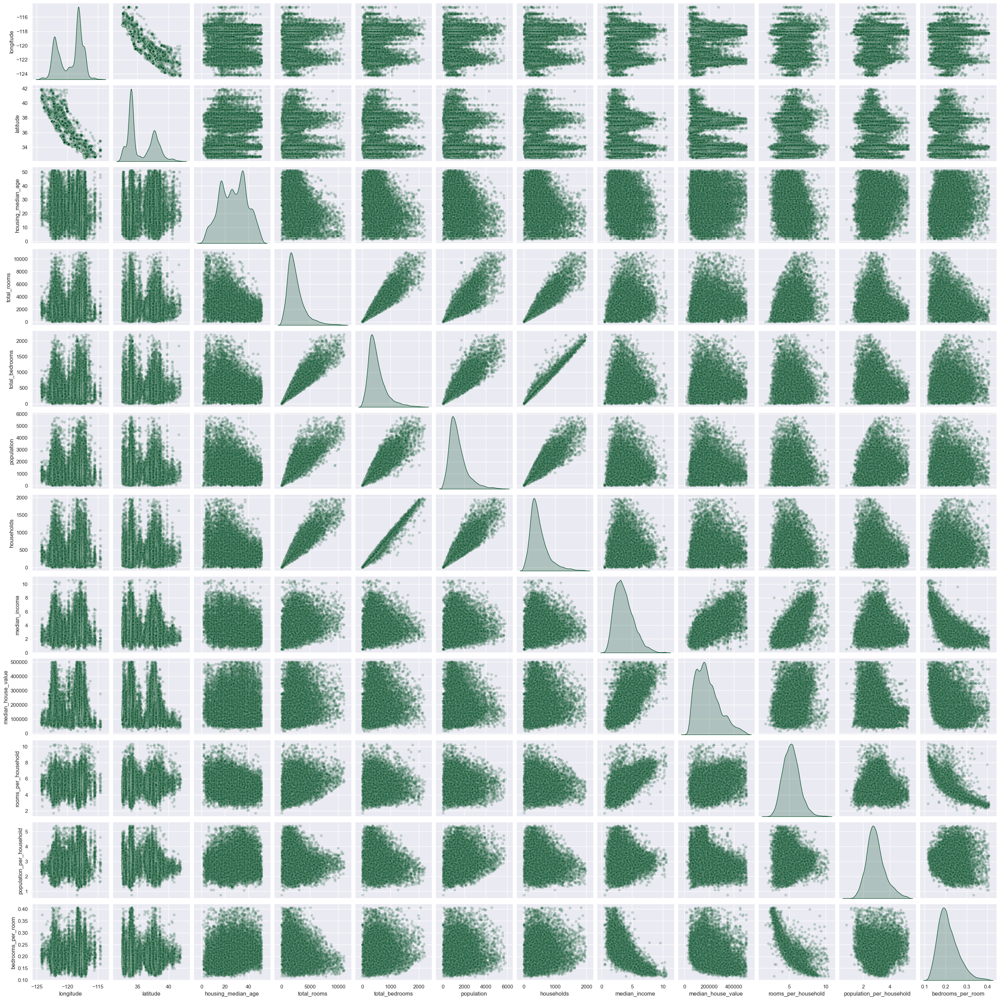

In [35]:
sns.pairplot(df_clean, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA))

É possível verificar a redução de outliers, de pontos concentrados nos extremos e as curvas menos estreitas.

It is possible to verify the reduction of outliers, points concentrated at the extremes and less narrow curves

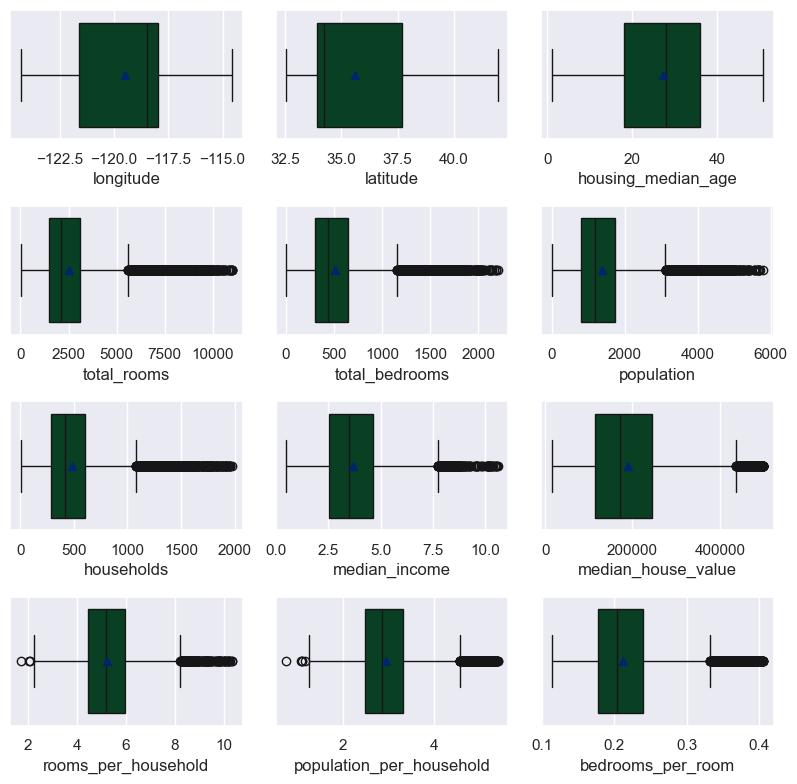

In [36]:
fig, axs = plt.subplots(4,3, figsize =(8,8))


#usar o flaten, para enumerar sequencialmente e passar por todas as colunas
#meu x será a coluna, 
for ax, coluna in zip(axs.flatten(), df_clean.select_dtypes('number').columns):
    sns.boxplot(
        x=df_clean[coluna],
        ax=ax,
        showmeans=True
    )
plt.tight_layout()
plt.show()

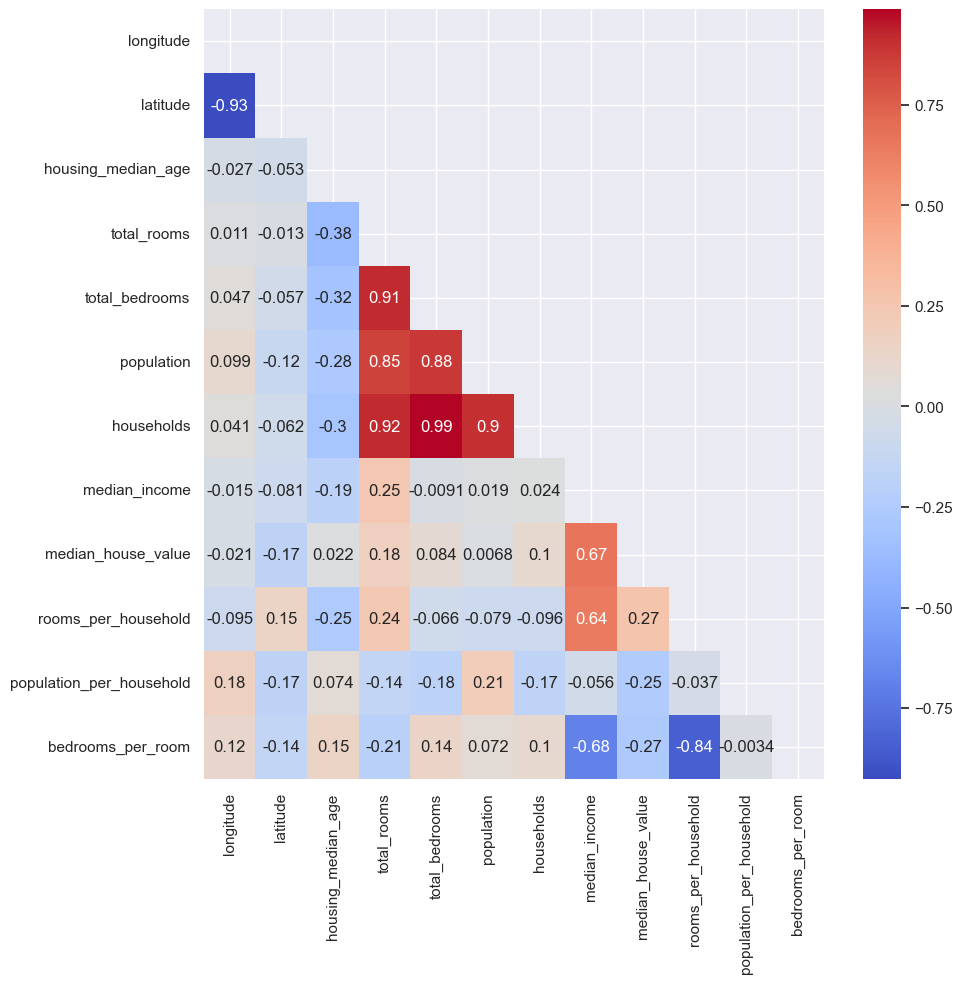

In [37]:
matriz=np.triu(df_clean.select_dtypes("number").corr()) #para exibir apenas metade do heatmap, já que é duplicado
#necessário parassar a mask
fig, ax = plt.subplots(figsize=(10,10))

sns.heatmap(df_clean.select_dtypes("number").corr(), 
            mask=matriz, 
            annot=True, 
            ax=ax, 
            cmap=PALETTE) 

plt.show()

Houve melhora na correlação após o tratamento dos outliers.
There was an improvement in correlation after treating outliers

In [39]:
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
ISLAND           2
Name: count, dtype: int64

In [40]:
df_clean = df_clean.loc[df_clean['ocean_proximity'] !="ISLAND"]
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
Name: count, dtype: int64

In [41]:
df_clean.loc[:, 'ocean_proximity'] = df_clean['ocean_proximity'].astype('category')
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  float64 
 3   total_rooms               17564 non-null  float64 
 4   total_bedrooms            17564 non-null  float64 
 5   population                17564 non-null  float64 
 6   households                17564 non-null  float64 
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  float64 
 9   ocean_proximity           17564 non-null  object  
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  float64 


In [42]:
colunas_valores_inteiros=[]
for coluna in df_clean.select_dtypes('number').columns:
    if df_clean[coluna].apply(float.is_integer).all():
        colunas_valores_inteiros.append(coluna)

colunas_valores_inteiros


['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_house_value']

In [43]:

colunas_valores_float = df_clean.select_dtypes('number').columns.difference(colunas_valores_inteiros)
colunas_valores_float

Index(['bedrooms_per_room', 'latitude', 'longitude', 'median_income',
       'population_per_household', 'rooms_per_household'],
      dtype='object')

In [44]:
df_clean.loc[:, colunas_valores_inteiros] = df_clean[colunas_valores_inteiros].apply(
    pd.to_numeric, downcast='integer' 
) 
df_clean.loc[:, colunas_valores_float] = df_clean[colunas_valores_float].apply(
    pd.to_numeric, downcast='float' 
)

In [45]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  float64 
 3   total_rooms               17564 non-null  float64 
 4   total_bedrooms            17564 non-null  float64 
 5   population                17564 non-null  float64 
 6   households                17564 non-null  float64 
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  float64 
 9   ocean_proximity           17564 non-null  object  
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  float64 


In [46]:
df_clean.describe() 

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedrooms_per_room
count,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00,17564.00
mean,-119.51,35.60,27.28,2510.51,515.38,1386.32,483.98,3.70,189570.80,5.25,2.93,0.21
std,1.98,2.15,11.32,1593.98,320.85,844.89,295.56,1.54,95971.41,1.13,0.69,0.05
min,-124.30,32.54,1.00,6.00,2.00,3.00,2.00,0.50,14999.00,1.71,0.75,0.11
25%,-121.60,33.92,18.00,1464.75,300.00,816.00,287.00,2.55,114300.00,4.45,2.47,0.18
50%,-118.46,34.24,28.00,2131.00,438.00,1196.00,415.00,3.48,171400.00,5.21,2.85,0.20
75%,-117.98,37.67,36.00,3124.00,643.00,1738.00,605.00,4.62,243800.00,5.96,3.31,0.24
max,-114.55,41.95,51.00,11026.00,2205.00,5804.00,1979.00,10.59,500000.00,10.35,5.39,0.41


In [ ]:
df_clean.to_parquet(DADOS_LIMPOS, index=False)